## Importing Libraries

In [224]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn import metrics

## Reading CSV file

In [225]:
data = pd.read_csv("cars_class (1).csv")
data

,ID,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
0,1,88,39,70,166,66,7,148,44,19,134,167,332,143,69,5,13,193,201,0
1,2,85,35,64,129,57,6,116,57,17,125,138,200,123,65,1,23,196,203,3
2,3,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,3
3,4,102,54,98,177,56,10,219,31,25,171,219,706,223,72,5,17,186,196,1
4,5,87,39,74,152,58,6,151,44,19,136,174,337,140,70,1,33,187,196,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714,715,111,58,105,183,51,6,265,26,29,174,285,1018,255,85,4,8,181,183,0
715,716,93,43,76,149,57,7,149,44,19,143,172,335,176,69,14,0,189,194,2
716,717,90,42,63,144,59,7,131,50,18,142,154,259,162,65,15,3,197,204,3
717,718,101,56,101,231,72,10,217,31,24,171,232,698,216,72,2,6,187,197,2


## Exploratory Data Analysis

In [4]:
data.shape

(719, 20)

In [49]:
data.columns

Index(['ID', 'Comp', 'Circ', 'D.Circ', 'Rad.Ra', 'Pr.Axis.Ra', 'Max.L.Ra',
       'Scat.Ra', 'Elong', 'Pr.Axis.Rect', 'Max.L.Rect', 'Sc.Var.Maxis',
       'Sc.Var.maxis', 'Ra.Gyr', 'Skew.Maxis', 'Skew.maxis', 'Kurt.maxis',
       'Kurt.Maxis', 'Holl.Ra', 'Class'],
      dtype='object')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 719 entries, 0 to 718
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   ID            719 non-null    int64
 1   Comp          719 non-null    int64
 2   Circ          719 non-null    int64
 3   D.Circ        719 non-null    int64
 4   Rad.Ra        719 non-null    int64
 5   Pr.Axis.Ra    719 non-null    int64
 6   Max.L.Ra      719 non-null    int64
 7   Scat.Ra       719 non-null    int64
 8   Elong         719 non-null    int64
 9   Pr.Axis.Rect  719 non-null    int64
 10  Max.L.Rect    719 non-null    int64
 11  Sc.Var.Maxis  719 non-null    int64
 12  Sc.Var.maxis  719 non-null    int64
 13  Ra.Gyr        719 non-null    int64
 14  Skew.Maxis    719 non-null    int64
 15  Skew.maxis    719 non-null    int64
 16  Kurt.maxis    719 non-null    int64
 17  Kurt.Maxis    719 non-null    int64
 18  Holl.Ra       719 non-null    int64
 19  Class         719 non-null   

In [6]:
data.describe()

,ID,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
count,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000
mean,360.000000,93.435327,44.851182,81.723227,168.579972,61.847010,8.625869,168.137691,41.075104,20.531293,148.030598,188.168289,436.215577,174.726008,72.682893,6.343533,12.394993,188.798331,195.407510,1.470097
std,207.701709,8.111406,6.150286,15.528208,33.809172,8.259136,4.916908,32.937591,7.764459,2.560969,14.560092,31.235395,174.964977,32.149568,7.542055,4.856169,8.742511,6.048522,7.235166,1.126477
min,1.000000,73.000000,33.000000,40.000000,105.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000,0.000000
25%,180.500000,87.000000,40.000000,70.000000,141.000000,57.000000,6.000000,146.000000,33.000000,19.000000,137.000000,167.000000,317.000000,149.000000,68.000000,2.000000,5.500000,184.000000,190.000000,0.000000
50%,360.000000,93.000000,44.000000,79.000000,166.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,178.000000,362.000000,174.000000,72.000000,6.000000,11.000000,188.000000,196.000000,1.000000
75%,539.500000,99.000000,49.000000,96.000000,194.500000,65.000000,10.000000,197.500000,46.000000,23.000000,159.000000,216.000000,584.500000,198.000000,76.000000,9.000000,18.000000,193.000000,201.000000,2.000000
max,719.000000,119.000000,59.000000,110.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,262.000000,135.000000,22.000000,41.000000,204.000000,211.000000,3.000000


As we see here in description mean and median of the Comp and Circ features are same

In [7]:
data.isnull().sum()

ID              0
Comp            0
Circ            0
D.Circ          0
Rad.Ra          0
Pr.Axis.Ra      0
Max.L.Ra        0
Scat.Ra         0
Elong           0
Pr.Axis.Rect    0
Max.L.Rect      0
Sc.Var.Maxis    0
Sc.Var.maxis    0
Ra.Gyr          0
Skew.Maxis      0
Skew.maxis      0
Kurt.maxis      0
Kurt.Maxis      0
Holl.Ra         0
Class           0
dtype: int64

There is no null values in the data

In [40]:
d_class= data["Class"].value_counts().reset_index()
d_class

,index,Class
0,0,189
1,1,180
2,3,177
3,2,173


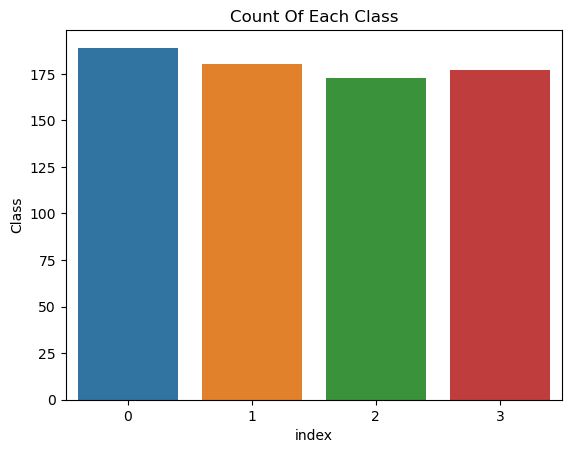

In [45]:
barp = sns.barplot(data = d_class,x=d_class["index"],y=d_class["Class"])
barp.set_title("Count Of Each Class")
plt.show()

From the above graph target variable is balanced and it a balanced data

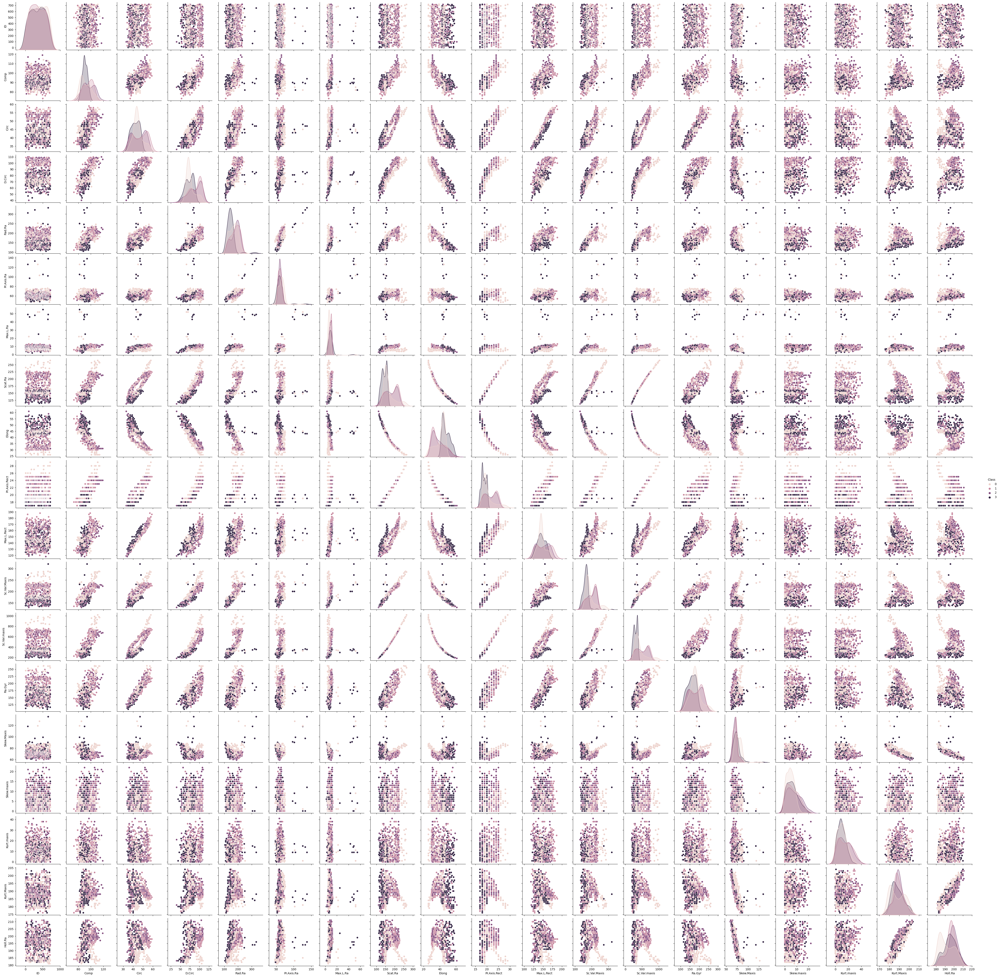

In [226]:
sns.pairplot(data, hue = "Class")

From the above pair plot we can see that here most of the features are highly corelated to each other some are positively correlated scat.Ra and Comp. Some are negatively correlated elong and comp 

# Visualization for Outlier detection

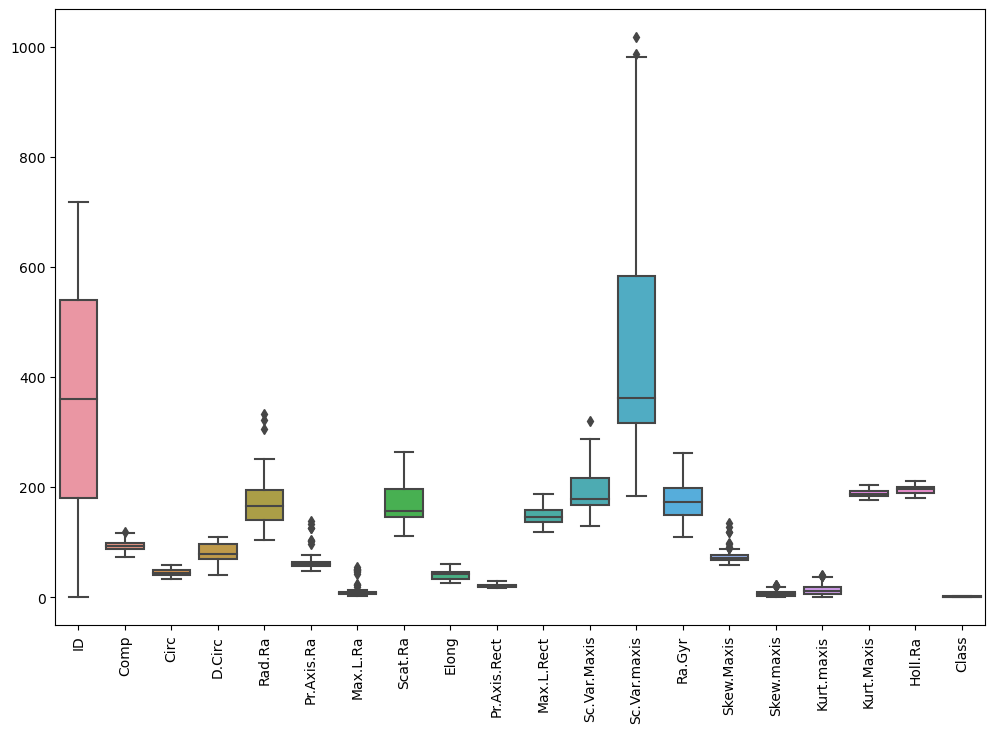

In [32]:
fig = plt.figure(figsize=(12,8))
bp = sns.boxplot(data =data)
bp.set_xticklabels(labels= data,rotation = 90)
plt.show()

From the box plot we can see that there are outliers in some of the columns such as Rad.Ra,Pr.Axis.Ra,Max.L.Ra, Sc.Var.Maxis, Sc.Var.maxis, Skew.Maxis, Skew.maxis,kurt.maxis

<AxesSubplot:>

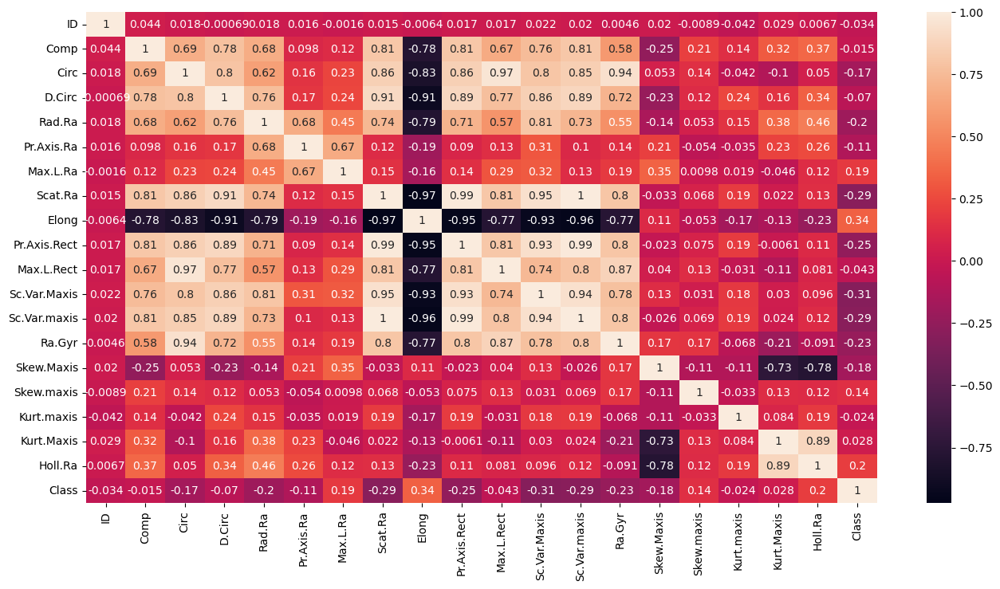

In [9]:
fig = plt.figure(figsize=(16,8))
sns.heatmap(data.corr(), annot = True)

AS we see from the above heat map most of the data are highly correlated
So we have to do PCA for removing highly correlated features and to reduce the dimensionality of the dataset

## Handling the outliers

In [33]:
data1= data.copy()

In [51]:
#create the column list which are having outliers

col_list=["Rad.Ra","Pr.Axis.Ra","Max.L.Ra","Sc.Var.Maxis","Skew.Maxis","Skew.maxis","Kurt.maxis"]

#Finding the IQR for Each columns
#Then replacing the values with median values of the columns

for col in col_list:
    q1 = data1[col].quantile(0.25)
    q3 = data1[col].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5* iqr
    upper = q3 + 1.5* iqr
    data1[col] = data1[col].mask((data1[col] < lower )|(data1[col] > upper ),data[col].median())



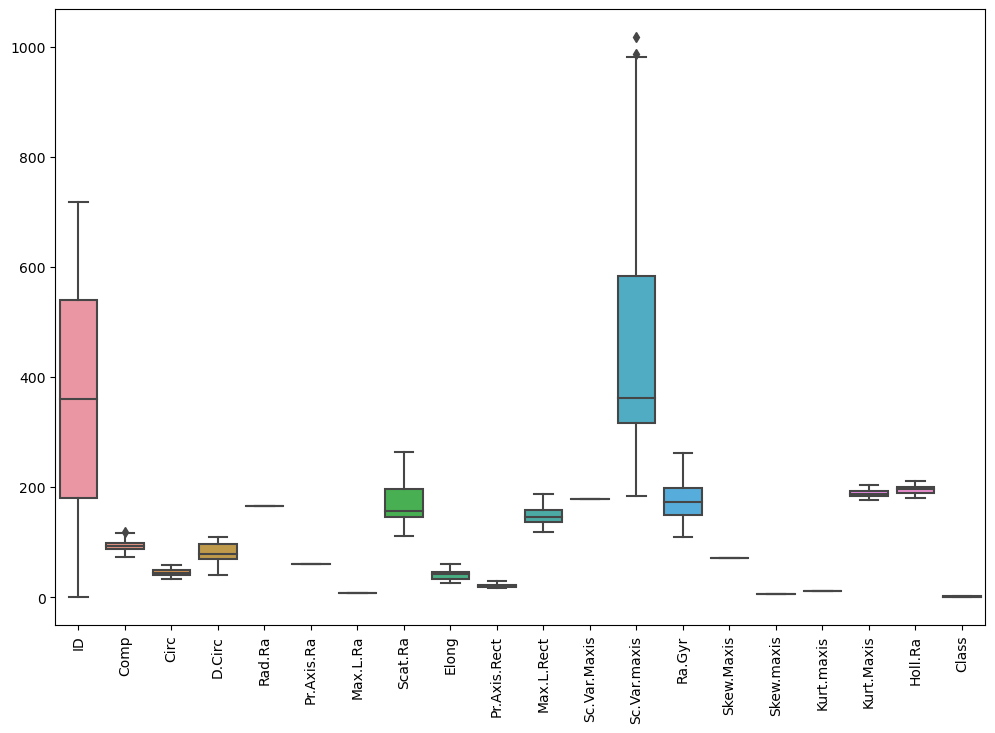

In [52]:
fig = plt.figure(figsize=(12,8))
bp = sns.boxplot(data =data1)
bp.set_xticklabels(labels= data1,rotation = 90)
plt.show()

After doing the outlier detection and Removal technique using IQR most of the outliers are getting removed

In [227]:
# spliting the dataset into X and y
X = data1.drop(["ID","Class"],axis = 1)
y = data1["Class"]

In [228]:
X

,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra
0,88,39,70,166.0,61.0,8.0,148,44,19,134,178.0,332,143,72.0,6.0,11.0,193,201
1,85,35,64,166.0,61.0,8.0,116,57,17,125,178.0,200,123,72.0,6.0,11.0,196,203
2,91,41,84,166.0,61.0,8.0,149,45,19,143,178.0,330,158,72.0,6.0,11.0,189,199
3,102,54,98,166.0,61.0,8.0,219,31,25,171,178.0,706,223,72.0,6.0,11.0,186,196
4,87,39,74,166.0,61.0,8.0,151,44,19,136,178.0,337,140,72.0,6.0,11.0,187,196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714,111,58,105,166.0,61.0,8.0,265,26,29,174,178.0,1018,255,72.0,6.0,11.0,181,183
715,93,43,76,166.0,61.0,8.0,149,44,19,143,178.0,335,176,72.0,6.0,11.0,189,194
716,90,42,63,166.0,61.0,8.0,131,50,18,142,178.0,259,162,72.0,6.0,11.0,197,204
717,101,56,101,166.0,61.0,8.0,217,31,24,171,178.0,698,216,72.0,6.0,11.0,187,197


In [229]:
ss = StandardScaler()
X = ss.fit_transform(X)

In [230]:
X = pd.DataFrame(X)
X.shape

(719, 18)

<AxesSubplot:>

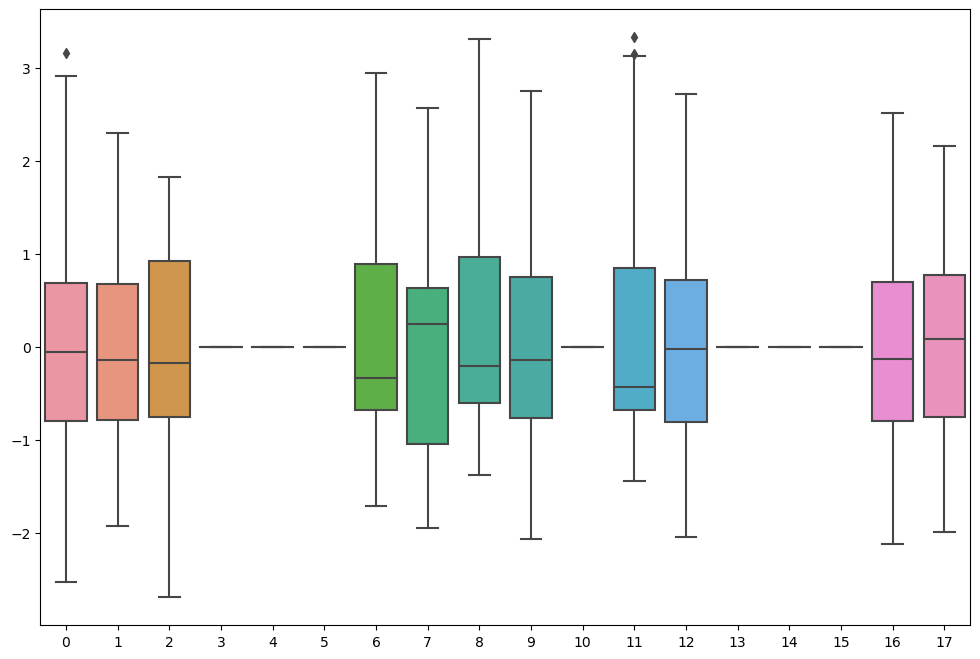

In [231]:
fig = plt.figure(figsize=(12,8))
sns.boxplot(data = X)

After applying the standardization technique most of the data are in uniform 

## Applying Principal Component Analysis

In [232]:
pca = PCA(n_components=18)
pca_f = pca.fit_transform(X)

In [233]:
pca_f

array([[-2.07901257e+00,  1.21963543e+00,  2.28688323e-01, ...,
         1.27704787e-34,  1.15046035e-35, -6.86121104e-52],
       [-4.35089447e+00,  1.87265445e+00, -2.03597691e-01, ...,
         8.13898477e-35,  1.12495308e-35, -2.29968074e-51],
       [-1.28637789e+00,  5.49587153e-01, -1.36241582e-01, ...,
         1.54738664e-34, -1.72303512e-35, -2.27203892e-51],
       ...,
       [-2.32046267e+00,  1.66296839e+00, -1.18127084e+00, ...,
        -1.88172303e-35,  7.19407156e-37, -6.12532244e-52],
       [ 4.17267105e+00, -4.62836791e-01, -3.65758127e-01, ...,
        -9.60085350e-36, -2.26555608e-36,  3.75518833e-52],
       [-1.03939807e+00,  2.47581482e+00,  1.13696380e+00, ...,
         2.98937105e-36,  2.78843778e-36, -2.16414768e-52]])

In [68]:
pca.explained_variance_

array([7.78049623e+000, 2.10529488e+000, 1.00235050e+000, 4.91874340e-001,
       2.51189781e-001, 1.78674011e-001, 9.58042916e-002, 5.18700259e-002,
       3.63941708e-002, 1.54552953e-002, 6.81100875e-003, 4.98552384e-004,
       3.69954467e-034, 7.00561230e-035, 1.67876211e-035, 1.80300196e-037,
       7.86442014e-068, 1.25514634e-072, 1.51308191e-100])

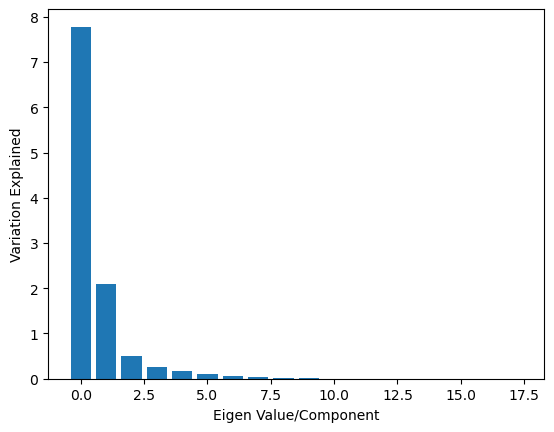

In [235]:
plt.bar(range(18),pca.explained_variance_)
plt.xlabel("Eigen Value/Component")
plt.ylabel("Variation Explained")
plt.show()

In [236]:
pca.explained_variance_ratio_ 

array([7.06304435e-001, 1.91065909e-001, 4.46542439e-002, 2.29513038e-002,
       1.62305453e-002, 8.70780132e-003, 4.70956451e-003, 3.30849122e-003,
       1.40406023e-003, 6.18384970e-004, 4.52612346e-005, 4.57642853e-035,
       6.80043751e-036, 1.66286299e-036, 3.14583013e-038, 7.29723670e-070,
       2.43759919e-071, 8.09403051e-103])

In [237]:
np.cumsum(pca.explained_variance_ratio_)

array([0.70630443, 0.89737034, 0.94202459, 0.96497589, 0.98120644,
       0.98991424, 0.9946238 , 0.99793229, 0.99933635, 0.99995474,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        ])

From the above plot and np.cumsum() values we see that with 8 features we can explained the 99% of varience in data

In [79]:
# pca components with 8 features
pca = PCA(n_components= 8)
pca_features = pca.fit_transform(X)

In [81]:
pca_features.shape

(719, 8)

In [82]:
pca_data = pd.DataFrame(pca_features)
pca_data

,0,1,2,3,4,5,6,7
0,-2.090937,1.177846,1.754250,0.234991,-0.263652,0.198055,0.251495,0.214016
1,-4.362699,1.831391,1.735159,-0.197495,0.094546,-0.062470,-0.052313,0.345863
2,-1.298283,0.507977,1.742472,-0.129941,-0.126205,-0.550485,-0.298890,-0.019215
3,4.253566,-0.720965,1.723881,-0.111656,0.088469,0.040162,0.272531,0.382647
4,-2.052036,0.074008,1.718307,0.517854,-0.356611,-0.299539,0.200245,0.100566
...,...,...,...,...,...,...,...,...
714,7.093262,-2.482780,-1.768186,1.379593,0.575146,0.634201,0.213742,0.510423
715,-1.082302,-0.020183,-1.731469,-0.262887,0.223550,0.127346,-0.395836,-0.129800
716,-2.308398,1.704656,-1.713446,-1.187571,0.295946,0.443216,0.107169,0.311034
717,4.184525,-0.421967,-1.699249,-0.371747,-0.211529,-0.138172,0.243136,0.116082


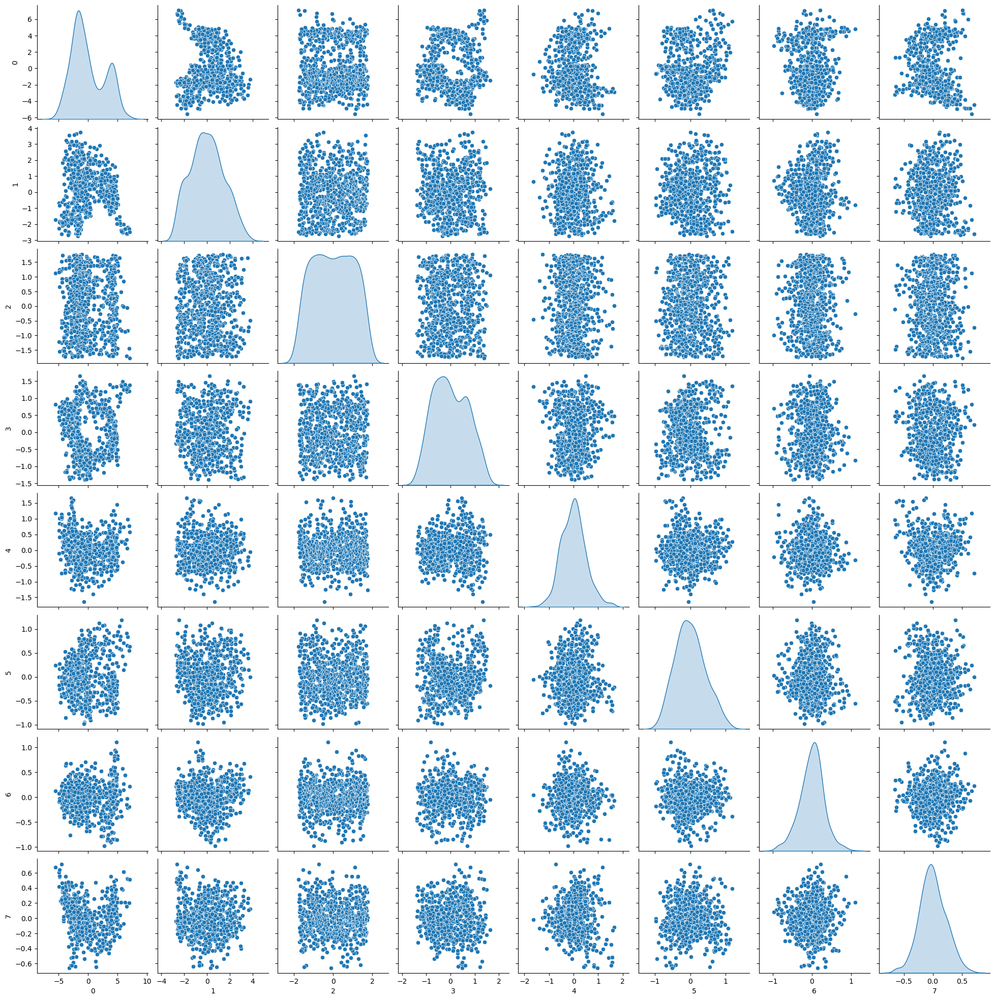

In [85]:
sns.pairplot(data = pca_data, diag_kind = "kde")

From this pair plot we can see that features are not correlated to each other they are independent

## Train and Test Data Spliting

In [89]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.2, random_state = 2)

# Model Training

### Logistic Regression

In [144]:
lr = LogisticRegression()
lr.fit(X_train,y_train)
y_pred = lr.predict(X_train)

In [136]:
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       0.76      0.90      0.82       146
           1       0.70      0.54      0.61       141
           2       0.60      0.56      0.58       142
           3       0.86      0.95      0.90       146

    accuracy                           0.74       575
   macro avg       0.73      0.74      0.73       575
weighted avg       0.73      0.74      0.73       575



From the scores of the Logistic Regression we see that 
accuracy = 74%
precision = 73%
recall = 74%
f1-score = 73%

In [145]:
print(confusion_matrix(y_train,y_pred))

[[132   4   9   1]
 [ 17  76  39   9]
 [ 23  28  79  12]
 [  2   1   5 138]]


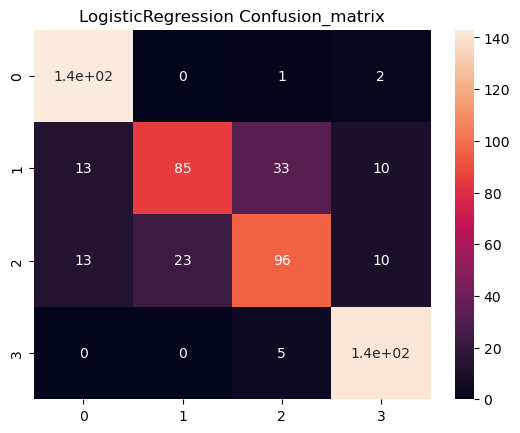

In [163]:
sns.heatmap(data=confusion_matrix(y_train,y_pred),annot = True)
plt.title("LogisticRegression Confusion_matrix")
plt.show()

### DecisionTreeClassifier

In [170]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)
y_pred = dtc.predict(X_train)

In [171]:
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       146
           1       1.00      1.00      1.00       141
           2       1.00      1.00      1.00       142
           3       1.00      1.00      1.00       146

    accuracy                           1.00       575
   macro avg       1.00      1.00      1.00       575
weighted avg       1.00      1.00      1.00       575



From the scores of the Decision Tree Classifier we see that 
accuracy = 100%
precision = 100%
recall = 100%
f1-score = 100%
from this we see dataset is overfitting

In [172]:
print(confusion_matrix(y_train,y_pred))

[[146   0   0   0]
 [  0 141   0   0]
 [  0   0 142   0]
 [  0   0   0 146]]


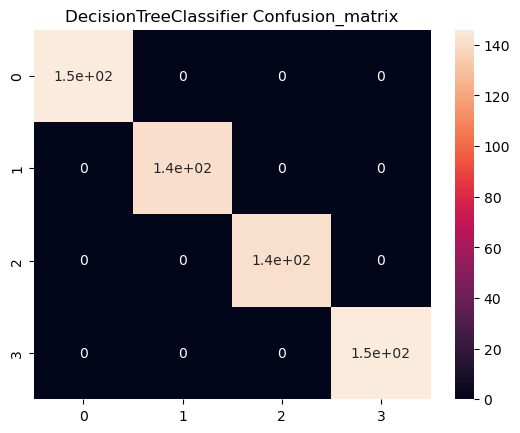

In [173]:
sns.heatmap(data=confusion_matrix(y_train,y_pred),annot = True)
plt.title("DecisionTreeClassifier Confusion_matrix")
plt.show()

### KNN Classifier

In [156]:
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)
y_pred = knn.predict(X_train)

F:\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [139]:
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       0.81      0.98      0.89       146
           1       0.78      0.65      0.71       141
           2       0.71      0.66      0.69       142
           3       0.91      0.94      0.92       146

    accuracy                           0.81       575
   macro avg       0.80      0.81      0.80       575
weighted avg       0.80      0.81      0.80       575



From the scores of the KNN Classifier we see that accuracy = 81% precision = 80% recall = 81% f1-score = 80%

In [140]:
print(confusion_matrix(y_train,y_pred))

[[143   0   3   0]
 [ 12  91  31   7]
 [ 19  22  94   7]
 [  2   3   4 137]]
0.808695652173913


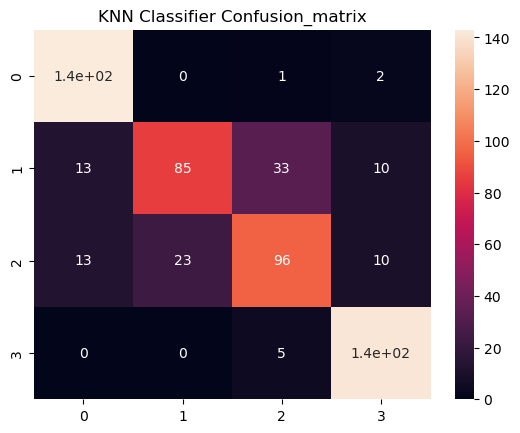

In [165]:
sns.heatmap(data=confusion_matrix(y_train,y_pred),annot = True)
plt.title("KNN Classifier Confusion_matrix")
plt.show()

### Random Forest Classifier

In [158]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
y_pred = rfc.predict(X_train)

In [142]:
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       146
           1       1.00      1.00      1.00       141
           2       1.00      1.00      1.00       142
           3       1.00      1.00      1.00       146

    accuracy                           1.00       575
   macro avg       1.00      1.00      1.00       575
weighted avg       1.00      1.00      1.00       575



From the scores of the Random Forest Classifier we see that accuracy = 100% precision = 100% recall = 100% f1-score = 100% from this we see dataset is overfitting

In [143]:
print(confusion_matrix(y_train,y_pred))

[[146   0   0   0]
 [  0 141   0   0]
 [  0   0 142   0]
 [  0   0   0 146]]
1.0


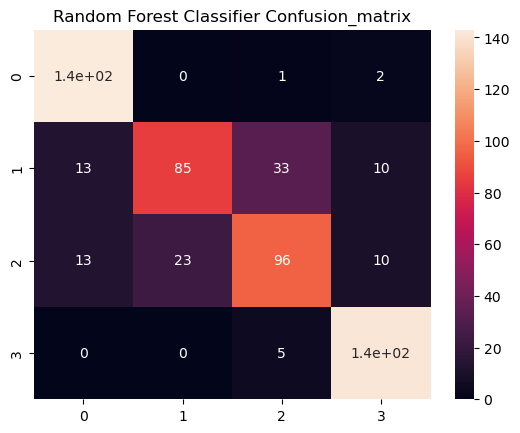

In [166]:
sns.heatmap(data=confusion_matrix(y_train,y_pred),annot = True)
plt.title("Random Forest Classifier Confusion_matrix")
plt.show()

### Support Vector Classifier

In [160]:
svc = SVC()
svc.fit(X_train,y_train)
y_pred = svc.predict(X_train)

In [132]:
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       146
           1       0.79      0.60      0.68       141
           2       0.71      0.68      0.69       142
           3       0.87      0.97      0.91       146

    accuracy                           0.81       575
   macro avg       0.80      0.81      0.80       575
weighted avg       0.80      0.81      0.80       575



From the scores of the Support Vector Classifier we see that accuracy = 81% precision = 80% recall = 81% f1-score = 80%

In [133]:
print(confusion_matrix(y_train,y_pred))

[[143   0   1   2]
 [ 13  85  33  10]
 [ 13  23  96  10]
 [  0   0   5 141]]
0.808695652173913


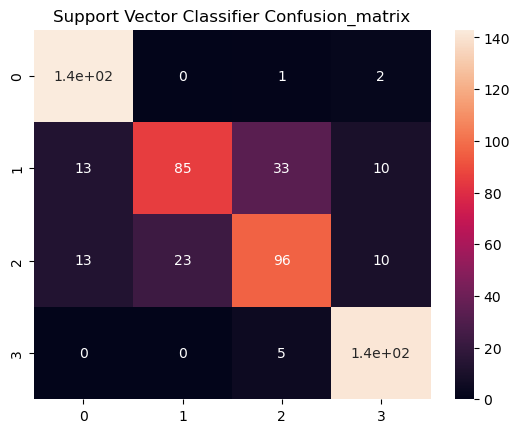

In [167]:
sns.heatmap(data=confusion_matrix(y_train,y_pred),annot = True)
plt.title("Support Vector Classifier Confusion_matrix")
plt.show()

# Hyper Parameter Tunning

## Logistic Regression

In [176]:
# setting the best params for Logistic Regression
lr = LogisticRegression()

params = {'solver': ['newton-cg', 'lbfgs', 'liblinear'],
          'penalty' : ['l2'],
          'C' : [100, 10, 1.0, 0.1, 0.01]}

grid = GridSearchCV(estimator= lr, param_grid = params, n_jobs = -1, cv = 10, verbose = 1)
grid.fit(X_train,y_train)

Fitting 10 folds for each of 15 candidates, totalling 150 fits


GridSearchCV(cv=10, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01], 'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             verbose=1)

In [177]:
grid.best_score_

0.7354506957047792

In [178]:
grid.best_params_

{'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}

In [191]:
# traning model with best params
lr = LogisticRegression(C =  100, penalty = 'l2', solver = 'newton-cg')
lr.fit(X_train,y_train)

LogisticRegression(C=100, solver='newton-cg')

In [193]:
y_pred = lr.predict(X_train)
y_test_pred= lr.predict(X_test)

In [194]:
# metrics for train data
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       0.79      0.90      0.84       146
           1       0.67      0.60      0.64       141
           2       0.63      0.60      0.62       142
           3       0.91      0.94      0.93       146

    accuracy                           0.76       575
   macro avg       0.75      0.76      0.76       575
weighted avg       0.76      0.76      0.76       575



In [195]:
# metrics for test data
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.89      0.91      0.90        43
           1       0.74      0.59      0.66        39
           2       0.61      0.71      0.66        31
           3       0.94      1.00      0.97        31

    accuracy                           0.80       144
   macro avg       0.79      0.80      0.79       144
weighted avg       0.80      0.80      0.80       144



## KNN Classifier

In [180]:
# setting the params for KNN Classifier
grid_params = { 
               'n_neighbors' : range(1,10),
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']
}


In [181]:
knn= KNeighborsClassifier()
grid1 = GridSearchCV(knn, grid_params, verbose = 1, cv=3, n_jobs = -1)
grid1.fit(X_train,y_train)

Fitting 3 folds for each of 54 candidates, totalling 162 fits


GridSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': range(1, 10),
                         'weights': ['uniform', 'distance']},
             verbose=1)

In [182]:
grid1.best_score_

0.7026068935427574

In [183]:
grid1.best_params_

{'metric': 'manhattan', 'n_neighbors': 8, 'weights': 'distance'}

In [196]:
# training the model with best params
knn= KNeighborsClassifier(metric = 'manhattan', n_neighbors = 8, weights = 'distance')
knn.fit(X_train,y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=8, weights='distance')

In [199]:
y_pred = knn.predict(X_train)
y_test_pred= knn.predict(X_test)

In [200]:
# metrics for train data
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       146
           1       1.00      1.00      1.00       141
           2       1.00      1.00      1.00       142
           3       1.00      1.00      1.00       146

    accuracy                           1.00       575
   macro avg       1.00      1.00      1.00       575
weighted avg       1.00      1.00      1.00       575



In [201]:
# metrics for test data
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.86      0.98      0.91        43
           1       0.66      0.49      0.56        39
           2       0.55      0.55      0.55        31
           3       0.83      0.94      0.88        31

    accuracy                           0.74       144
   macro avg       0.72      0.74      0.72       144
weighted avg       0.73      0.74      0.73       144



## SVC

In [203]:
# setting the params for Support Vector Classifier
params = {
          'kernel': ['poly', 'rbf', 'sigmoid'],
          'C' : [50, 10, 1.0, 0.1, 0.01],         
          'gamma': ['scale']
    
}

In [204]:
svc = SVC()
grid2 = GridSearchCV(estimator= svc, param_grid= params, n_jobs=-1, cv= 3)
grid2.fit(X_train,y_train)

GridSearchCV(cv=3, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [50, 10, 1.0, 0.1, 0.01], 'gamma': ['scale'],
                         'kernel': ['poly', 'rbf', 'sigmoid']})

In [205]:
grid2.best_score_

0.7965386852821408

In [206]:
grid2.best_params_

{'C': 50, 'gamma': 'scale', 'kernel': 'rbf'}

In [207]:
#training the model with best params
svc = SVC(C = 50, gamma = 'scale', kernel = 'rbf')
svc.fit(X_train,y_train)

SVC(C=50)

In [211]:
y_pred = svc.predict(X_train)
y_test_pred= svc.predict(X_test)

In [212]:
# metrics for train data
print(metrics.classification_report(y_train,y_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99       146
           1       0.95      0.88      0.91       141
           2       0.91      0.95      0.93       142
           3       1.00      0.99      1.00       146

    accuracy                           0.96       575
   macro avg       0.96      0.96      0.96       575
weighted avg       0.96      0.96      0.96       575



In [219]:
# metrics for test data
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94        43
           1       0.81      0.74      0.77        39
           2       0.67      0.71      0.69        31
           3       0.97      0.90      0.93        31

    accuracy                           0.84       144
   macro avg       0.84      0.83      0.83       144
weighted avg       0.84      0.84      0.84       144



# Final Model

In [215]:
#Support Vector Classifier as final model
svc = SVC(C = 50, gamma = 'scale', kernel = 'rbf')
svc.fit(X_train,y_train)
y_test_pred= svc.predict(X_test)

In [216]:
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94        43
           1       0.81      0.74      0.77        39
           2       0.67      0.71      0.69        31
           3       0.97      0.90      0.93        31

    accuracy                           0.84       144
   macro avg       0.84      0.83      0.83       144
weighted avg       0.84      0.84      0.84       144



In [217]:
print(confusion_matrix(y_test,y_test_pred))

[[42  0  1  0]
 [ 3 29  7  0]
 [ 1  7 22  1]
 [ 0  0  3 28]]


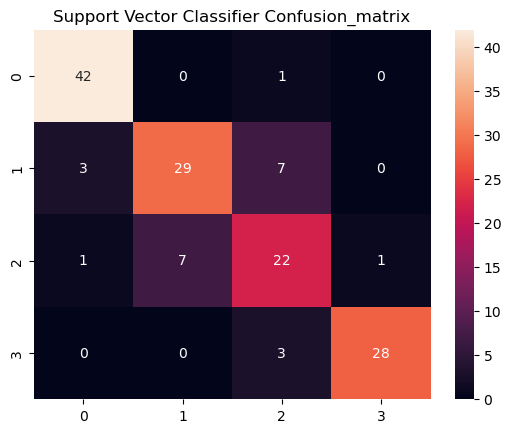

In [220]:
sns.heatmap(data=confusion_matrix(y_test,y_test_pred),annot = True)
plt.title("Support Vector Classifier Confusion_matrix")
plt.show()

### The final model that we give is Support Vector Classifier, before Hyperparameter Tuning it gives 81% accuracy and after HyperParameter Tuning it gives 84%  of accuracy 
### precision is 83%
### recall is 84%
### f1_score 84%